In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os
import os.path as osp
from skimage import io as skio
from cytokit import io as ckio
from cytokit import config as ckconfig
exp_name = '20180101_codex_mouse_spleen_balbc_slide1'
montage_file = 'BALBc-1_Fused.tif'

conf_path = osp.join(os.environ['CYTOKIT_ANALYSIS_REPO_DIR'], 'config/experiment/20180101_codex_spleen', exp_name, 'experiment.yaml')
img_path = osp.join(os.environ['CYTOKIT_DATA_DIR'], '20180101_codex_spleen/20180101_codex_mouse_spleen_balbc_slide1/external/', montage_file)

In [14]:
img = ckio.read_tile(img_path)
img.shape

/lab/repos/cytokit/python/pipeline/cytokit/io.py:118: UserWarning: ImageJ tags do not contain "axes" property (file = /lab/data/20180101_codex_spleen/20180101_codex_mouse_spleen_balbc_slide1/external/BALBc-1_Fused.tif, tags = {'images': 54, 'Labels': ['img_t1_z01_c1', 'img_t1_z01_c2', 'img_t1_z01_c3', 'img_t1_z02_c1', 'img_t1_z02_c2', 'img_t1_z02_c3', 'img_t1_z03_c1', 'img_t1_z03_c2', 'img_t1_z03_c3', 'img_t1_z04_c1', 'img_t1_z04_c2', 'img_t1_z04_c3', 'img_t1_z05_c1', 'img_t1_z05_c2', 'img_t1_z05_c3', 'img_t1_z06_c1', 'img_t1_z06_c2', 'img_t1_z06_c3', 'img_t1_z07_c1', 'img_t1_z07_c2', 'img_t1_z07_c3', 'img_t1_z08_c1', 'img_t1_z08_c2', 'img_t1_z08_c3', 'img_t1_z09_c1', 'img_t1_z09_c2', 'img_t1_z09_c3', 'img_t1_z10_c1', 'img_t1_z10_c2', 'img_t1_z10_c3', 'img_t1_z11_c1', 'img_t1_z11_c2', 'img_t1_z11_c3', 'img_t1_z12_c1', 'img_t1_z12_c2', 'img_t1_z12_c3', 'img_t1_z13_c1', 'img_t1_z13_c2', 'img_t1_z13_c3', 'img_t1_z14_c1', 'img_t1_z14_c2', 'img_t1_z14_c3', 'img_t1_z15_c1', 'img_t1_z15_c2', 

(18, 1, 3, 1929, 2000)

In [15]:
config = ckconfig.load(conf_path)

In [20]:
plt.gray()

<Figure size 432x288 with 0 Axes>

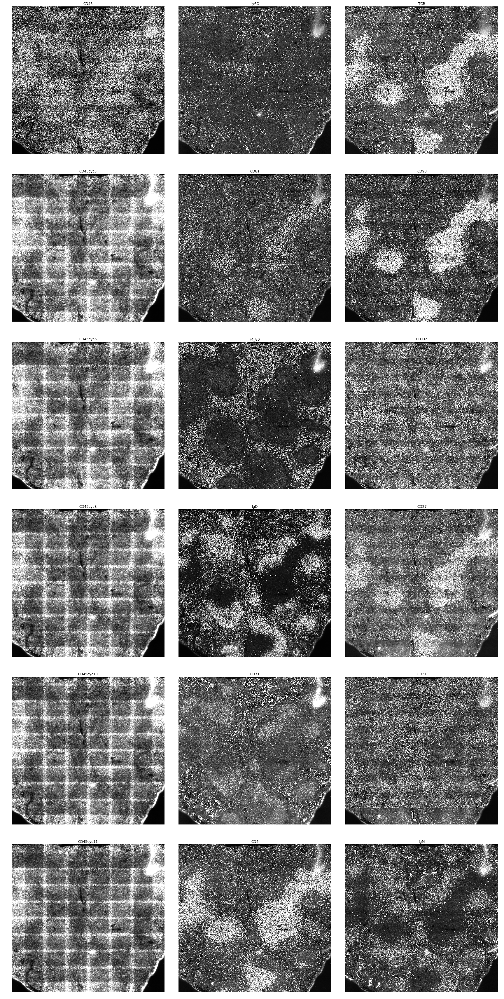

In [40]:
from skimage.filters import threshold_otsu
cycles = [1, 5, 6, 8, 10, 11]
fig, ax = plt.subplots(len(cycles), 3)
fig.set_size_inches(24, 48)
chnames = config.channel_names

clips = {
    # Cy5
    'TCR': 3800,
    'CD90': 12900,
    'CD11c': 8000,
    'CD27': 4000,
    'CD31': 9000,
    'IgM': 3000,
    
    # Cy3
    'Ly6C': 2000,
    'CD4': 9000,
    'CD8a': 12000,
    'CD71': 2000,
}
for i, icyc in enumerate(cycles):
    for j in range(3):
        ch = chnames[(icyc-1)*3 + j]
        chimg = img[icyc-1, 0, j]
        if ch in clips:
            maxv = clips[ch]
        else:
            maxv = threshold_otsu(chimg) + 2000
        chimg = chimg.clip(0, maxv)
        ax[i, j].axis('off')
        ax[i, j].imshow(chimg)
        ax[i, j].set_title(ch)
plt.tight_layout()